In [1]:
import numpy as np

from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

from sklearn.pipeline import make_pipeline

In [268]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())
print("CUDA device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None")
print("CUDA version (PyTorch compiled with):", torch.version.cuda)

CUDA available: True
CUDA device count: 1
CUDA device name: NVIDIA GeForce RTX 4060 Laptop GPU
CUDA version (PyTorch compiled with): 12.1


In [269]:
# Regression เพื่อวิเคราะห]ความสัมพันธ]ตัวแปรตUนตlอตัวแปรตาม:
# § Linear regression
# § Multiple regression
# § Polynomial regression
# § Others



# Classification สถานะบริษัท (Bankrupt vs Non-Bankrupt)
# Regression: วิเคราะห์ความสัมพันธ์ของตัวแปรทางการเงิน (Net Income, Market Value)

In [270]:
########### part linear regression from scratch #########
#########################################################

In [271]:
class LinearRegressionFromScratch:
    def __init__(self, learning_rate=0.01, n_iterations=1000):
        self.coef_ = None
        self.intercept_ = None
        self.learning_rate = learning_rate
        self.n_iterations = n_iterations

    def fit(self, X, y):
        # Initialize parameters
        n_samples, n_features = X.shape
        self.coef_ = np.zeros(n_features)
        self.intercept_ = 0
        
        for _ in range(self.n_iterations):
            # Predictions
            y_pred = np.dot(X, self.coef_) + self.intercept_
            
            # Compute gradients (using simple error, not squared)
            error = y_pred - y
            
            # Correct gradients
            intercept_gradient = (1/n_samples) * np.sum(error)
            coef_gradient = (1/n_samples) * np.dot(X.T, error)
            
            # Update parameters
            self.intercept_ -= self.learning_rate * intercept_gradient
            self.coef_ -= self.learning_rate * coef_gradient

    def predict(self, X):
        return np.dot(X, self.coef_) + self.intercept_
    

In [272]:
import numpy as np

def mse(y_true, y_pred):
    # Convert to numpy arrays for easier computation
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Calculate squared differences
    squared_errors = (y_true - y_pred) ** 2
    
    # Return mean of squared errors
    return np.mean(squared_errors)

def mae(y_true, y_pred):
    # Convert to numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Calculate absolute differences
    absolute_errors = np.abs(y_true - y_pred)
    
    # Return mean of absolute errors
    return np.mean(absolute_errors)

In [273]:
# visual data

In [3]:
file_path='./dataset/american_bankruptcy.csv'
bankrupt_df=pd.read_csv(file_path)
bankrupt_df=bankrupt_df.rename(columns={
    'X1':'current_asset',
    'X2':'cost_of_goods_sold',
    'X3':'depreciation_amortization',
    'X4':'EBITDA',
    'X5':'inventory',
    'X6':'net_income',
    'X7':'total_receivable',
    'X8':'market_value',
    'X9':'net_sales',
    'X10':'total_assets',
    'X11':'total_long_term_debt',
    'X12':'EBIT',
    'X13':'gross_profit',
    'X14':'total_current_liabilities',
    'X15':'retained_earning',
    'X16':'total_revenue',
    'X17':'total_liabilities',
    'X18':'total_operating_expenses',
       
})

target='market_value'
numeric_features=['year','current_asset','cost_of_goods_sold','depreciation_amortization',
    'EBITDA','total_receivable','net_income','net_sales',
    'total_assets','EBIT','gross_profit',
    'total_current_liabilities','retained_earning','total_revenue','total_liabilities',
    'total_operating_expenses','total_long_term_debt','inventory']

more_5_features=['year','current_asset',
    'EBITDA','total_receivable','net_income','net_sales',
    'total_assets','EBIT','gross_profit',
    'total_current_liabilities','retained_earning','total_revenue','total_liabilities',
    ]

numeric=[ 'year','current_asset','cost_of_goods_sold','depreciation_amortization',
    'EBITDA','inventory','total_receivable','market_value','net_sales',
    'total_assets','total_long_term_debt','EBIT','gross_profit',
    'total_current_liabilities','retained_earning','total_revenue','total_liabilities',
    'total_operating_expenses','net_income']

features=[ 'EBIT','gross_profit','current_asset','total_assets','total_current_liabilities','net_income']

features1=[ 'EBITDA','net_income','current_asset','total_assets','total_current_liabilities']
bankrupt_df[numeric].dtypes


year                           int64
current_asset                float64
cost_of_goods_sold           float64
depreciation_amortization    float64
EBITDA                       float64
inventory                    float64
total_receivable             float64
market_value                 float64
net_sales                    float64
total_assets                 float64
total_long_term_debt         float64
EBIT                         float64
gross_profit                 float64
total_current_liabilities    float64
retained_earning             float64
total_revenue                float64
total_liabilities            float64
total_operating_expenses     float64
net_income                   float64
dtype: object

In [4]:

print(bankrupt_df.isnull().sum())

# Optional: check if there is any missing value at all
if bankrupt_df.isnull().values.any():
    print("There are missing values in the dataset")
else:
    print("No missing values")

company_name                 0
status_label                 0
year                         0
current_asset                0
cost_of_goods_sold           0
depreciation_amortization    0
EBITDA                       0
inventory                    0
net_income                   0
total_receivable             0
market_value                 0
net_sales                    0
total_assets                 0
total_long_term_debt         0
EBIT                         0
gross_profit                 0
total_current_liabilities    0
retained_earning             0
total_revenue                0
total_liabilities            0
total_operating_expenses     0
dtype: int64
No missing values


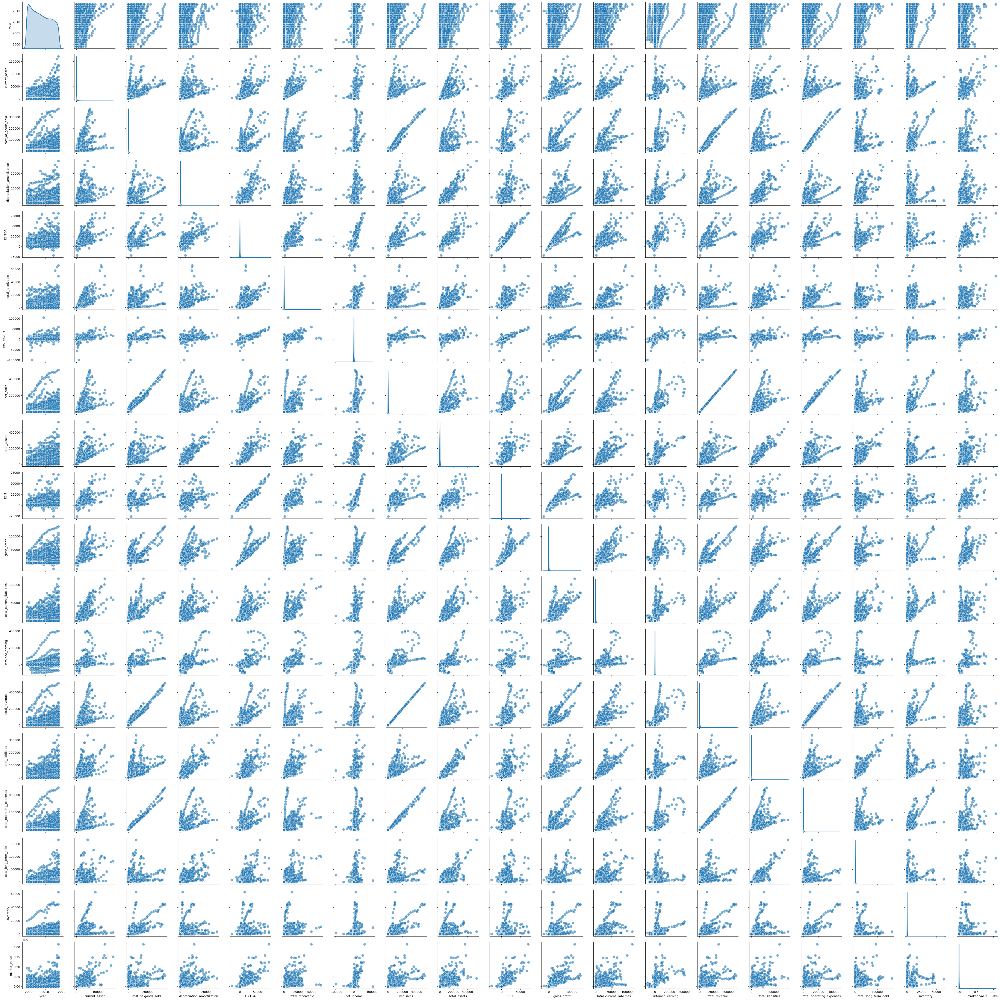

In [275]:
# Pick features + target
import matplotlib.pyplot as plt
import seaborn as sns

# Subset dataframe
df_plot = bankrupt_df[numeric_features + [target]]

# Create pairplot with larger fonts
sns.pairplot(df_plot, 
             diag_kind="kde",
             plot_kws={'alpha': 0.6, 's': 80},  # Scatter plot settings
             diag_kws={'linewidth': 2})         # Diagonal plot settings

# Increase font sizes for all labels
plt.rc('font', size=22)               # General font size
plt.rc('axes', titlesize=16)          # Axis title size
plt.rc('axes', labelsize=16)          # Axis label size
plt.rc('xtick', labelsize=14)         # X tick label size
plt.rc('ytick', labelsize=14)         # Y tick label size

plt.show()

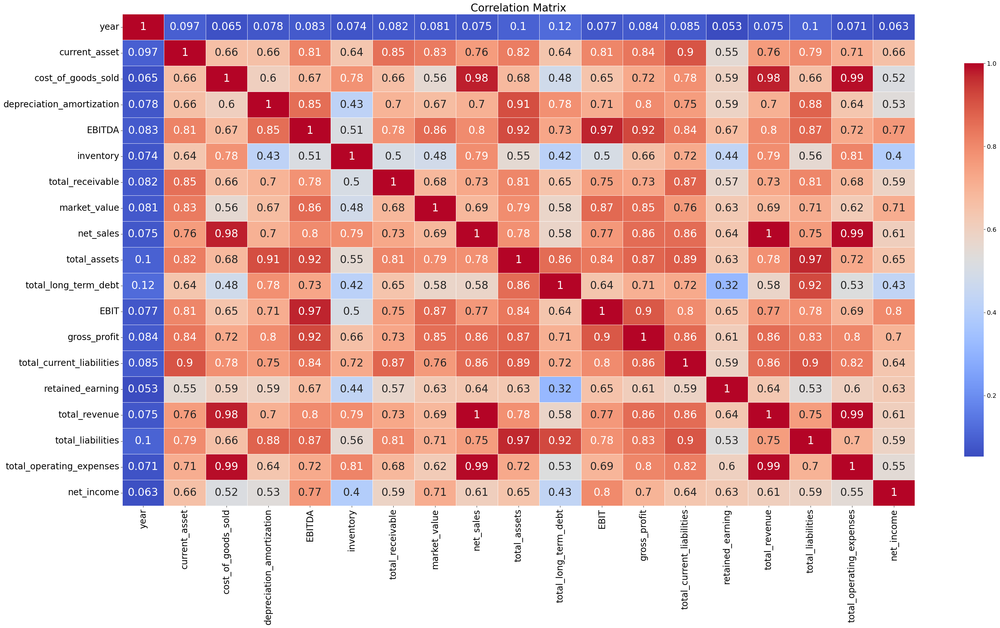

In [276]:
import matplotlib.pyplot as plt
import seaborn as sns

df_numeric = bankrupt_df[numeric]
plt.figure(figsize=(40,20))
corr = df_numeric.corr()

sns.heatmap(corr, 
            xticklabels=corr.columns,
            yticklabels=corr.columns,
            cmap='coolwarm',
            annot=True,
            linewidths=.5,
            annot_kws={"size": 24},        # Correlation number font size
            cbar_kws={"shrink": 0.8})      # Color bar size

# Increase tick label sizes - MAKE THESE BIGGER
plt.xticks(fontsize=20)                    # Changed from 12 to 20
plt.yticks(fontsize=20)                    # Changed from 12 to 20
plt.title('Correlation Matrix', fontsize=24)  # Made title bigger too
plt.show()

In [277]:
##########################################################

In [278]:
#############  this part is linear regression of net income ################

In [279]:
#### from scratch ######

In [280]:
import numpy as np
from sklearn.preprocessing import StandardScaler

use_df=bankrupt_df.copy()
X=use_df[['EBITDA']]
y=use_df['market_value']
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)


# 2. Train your model using scaled data
# Scale after splitting (important!)
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Use your custom model
model = LinearRegressionFromScratch(learning_rate=0.01, n_iterations=1000)
model.fit(x_train_scaled, y_train)  # Train on scaled training data

# Predict on scaled test data
y_pred = model.predict(x_test_scaled)


In [281]:
#####sklearn single linear regression #####
y_pred

array([   170.58591897,    738.42984917,   -148.39702781, ...,
          456.90350147,   4043.54004505, 111926.14528007], shape=(15737,))

In [282]:
print(y_pred[:10])
################ from scratch for single linearregression #################
print(y_test[:10])

[  170.58591897   738.42984917  -148.39702781   532.24940556
   543.45255554   401.76103078   457.26540098  5200.63504808
 19373.31997833   900.96206517]
58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64


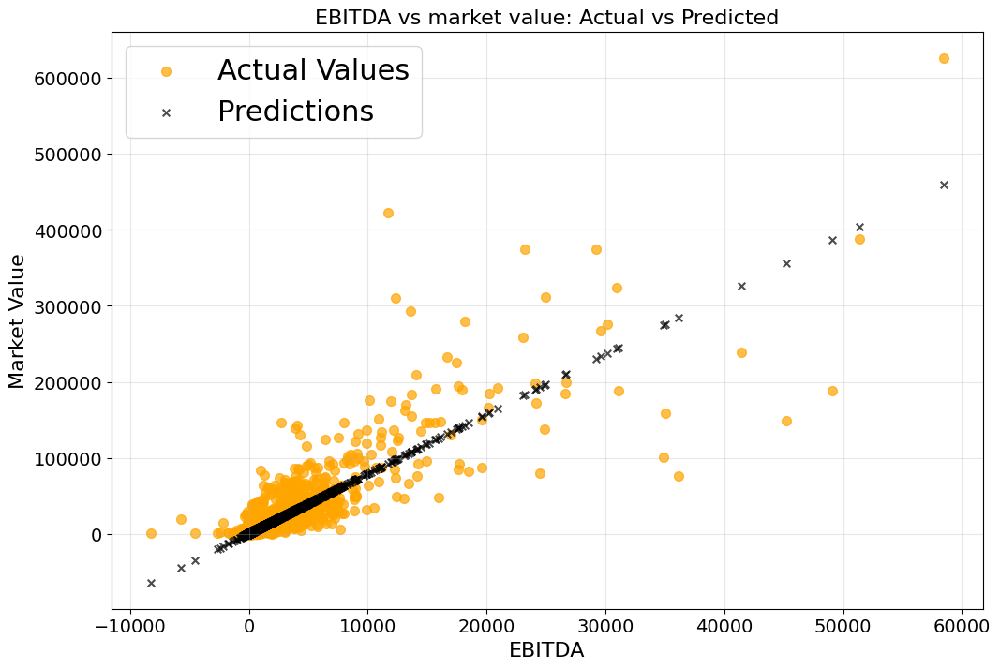

In [283]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=20000

plt.scatter(x_test['EBITDA'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBITDA'][:amount], y_pred[:amount], color='black', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBITDA')
plt.ylabel('Market Value')
plt.title('EBITDA vs market value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [284]:
SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.7518432149852619)

In [285]:

use_df=bankrupt_df.copy()
X=use_df[['EBITDA']]
y=use_df['market_value']


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('classifier',LinearRegression())
                  
])

pipeline.fit(x_train,y_train)
y_pred=pipeline.predict(x_test)



In [286]:
################ from scratch for single linearregression #################
print(y_pred[:10])
################ from scratch for single linearregression #################
print(y_test[:10])






[  170.5932837    738.46172949  -148.40343457   532.27238442
   543.47601808   401.77837605   457.28514255  5200.85957568
 19374.15638483   901.0009625 ]
58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64


In [287]:
SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.751843265359096)

In [288]:

print(f'mse: {mse(y_test,y_pred)} || mae: {mae(y_test,y_pred)}')

mse: 62085548.0695596 || mae: 1735.9108762691571


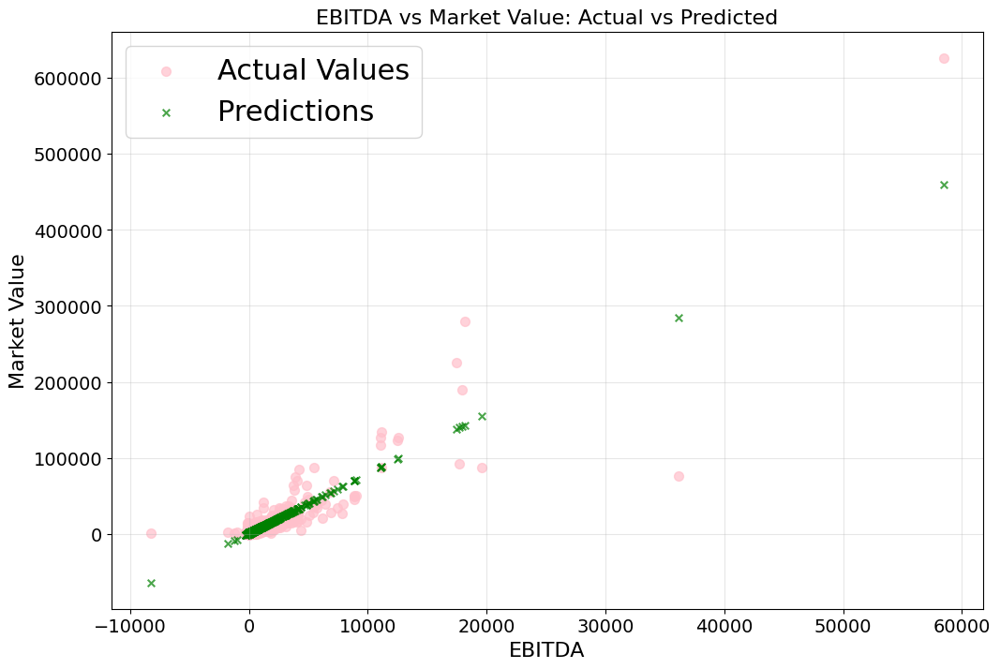

In [289]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=3000

plt.scatter(x_test['EBITDA'][:amount], y_test[:amount], color='pink', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBITDA'][:amount], y_pred[:amount], color='green', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBITDA')
plt.ylabel('Market Value')
plt.title('EBITDA vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [290]:
SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2


np.float64(0.751843265359096)

In [291]:

print(f'mse: {mse(y_test,y_pred)} || mae: {mae(y_test,y_pred)}')

mse: 62085548.0695596 || mae: 1735.9108762691571


In [292]:
use_df=bankrupt_df.copy()
X=use_df[['net_income']]
y=use_df['market_value']


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('classifier',LinearRegression())
                  
])

pipeline.fit(x_train,y_train)
y_pred_MarketValue=pipeline.predict(x_test)

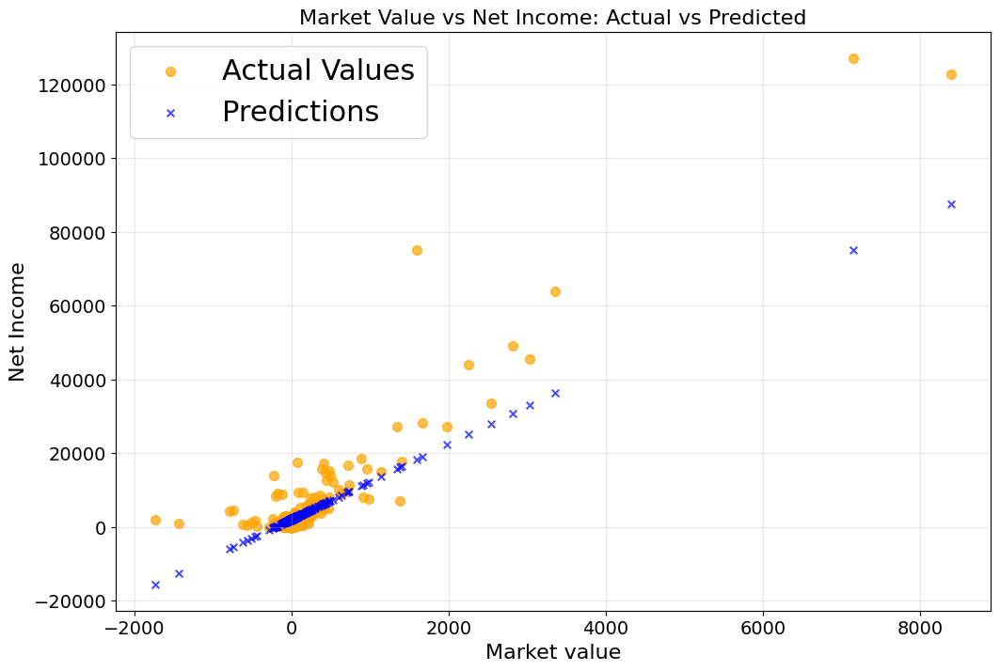

In [293]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=500

plt.scatter(x_test['net_income'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['net_income'][:amount], y_pred_MarketValue[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('Market value')
plt.ylabel('Net Income')
plt.title('Market Value vs Net Income: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [294]:
SSR=((y_test-y_pred_MarketValue)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.5914957331580684)

In [295]:
print(y_pred_MarketValue[:10])
################ from scratch for single linearregression #################
print(y_test[:10])

[ -141.68703638  2318.23714848  1274.69344563  2703.80603271
  2195.45891288  2064.23674519  2125.6869771    298.06968703
 15777.56950226  2252.936728  ]
58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64


In [296]:
use_df=bankrupt_df.copy()
X=use_df[['gross_profit']]
y=use_df['market_value']


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('classifier',LinearRegression())
                  
])

pipeline.fit(x_train,y_train)
y_pred_EBITDA=pipeline.predict(x_test)

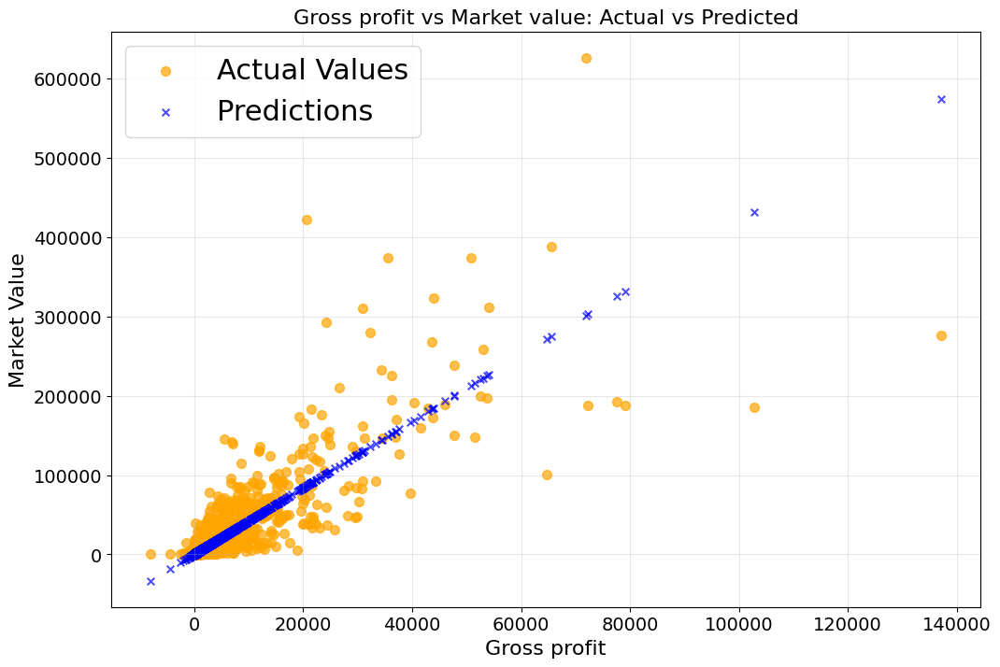

In [297]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=50000

plt.scatter(x_test['gross_profit'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['gross_profit'][:amount], y_pred_EBITDA[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('Gross profit')
plt.ylabel('Market Value')
plt.title('Gross profit vs Market value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [298]:
SSR=((y_test-y_pred_EBITDA)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.7062374847977284)

In [299]:
# subplot of linear regression




In [300]:
##########################################################

In [301]:
#############  this part is multiple linear regression of net income ################

In [302]:
##########################################################

In [303]:
bankrupt_df.columns

Index(['company_name', 'status_label', 'year', 'current_asset',
       'cost_of_goods_sold', 'depreciation_amortization', 'EBITDA',
       'inventory', 'net_income', 'total_receivable', 'market_value',
       'net_sales', 'total_assets', 'total_long_term_debt', 'EBIT',
       'gross_profit', 'total_current_liabilities', 'retained_earning',
       'total_revenue', 'total_liabilities', 'total_operating_expenses'],
      dtype='object')

In [304]:
bankrupt_df.shape

(78682, 21)

In [305]:
bankrupt_df.dtypes

company_name                  object
status_label                  object
year                           int64
current_asset                float64
cost_of_goods_sold           float64
depreciation_amortization    float64
EBITDA                       float64
inventory                    float64
net_income                   float64
total_receivable             float64
market_value                 float64
net_sales                    float64
total_assets                 float64
total_long_term_debt         float64
EBIT                         float64
gross_profit                 float64
total_current_liabilities    float64
retained_earning             float64
total_revenue                float64
total_liabilities            float64
total_operating_expenses     float64
dtype: object

In [306]:
use_df=bankrupt_df.copy()

In [307]:

X=use_df[features]
y=use_df[target]


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# ind=30000
# X=use_df[features][:ind]
# y=use_df[target][:ind]

# x_test=use_df[features][ind:ind+30000]
# y_test=use_df[target][ind:ind+30000]



In [308]:
model=linear_model.LinearRegression()
model.fit(x_train,y_train)

predict=model.predict(x_test)
print(predict[:10])

[-8.34684089e+02  6.78394631e+02 -2.21650708e+02  2.03603210e+02
  2.64199994e+02  3.88940549e+01 -1.09356211e+01  1.51879788e+03
  2.36887792e+04  8.50752888e+02]


In [309]:
y_test[:10]

58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64

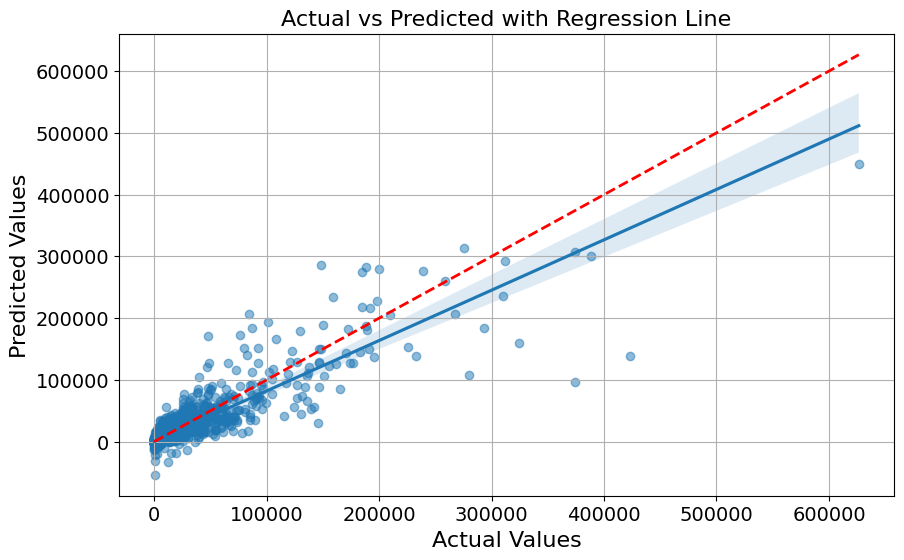

In [310]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=predict, scatter_kws={'alpha':0.5})
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted with Regression Line')
plt.grid(True)
plt.show()

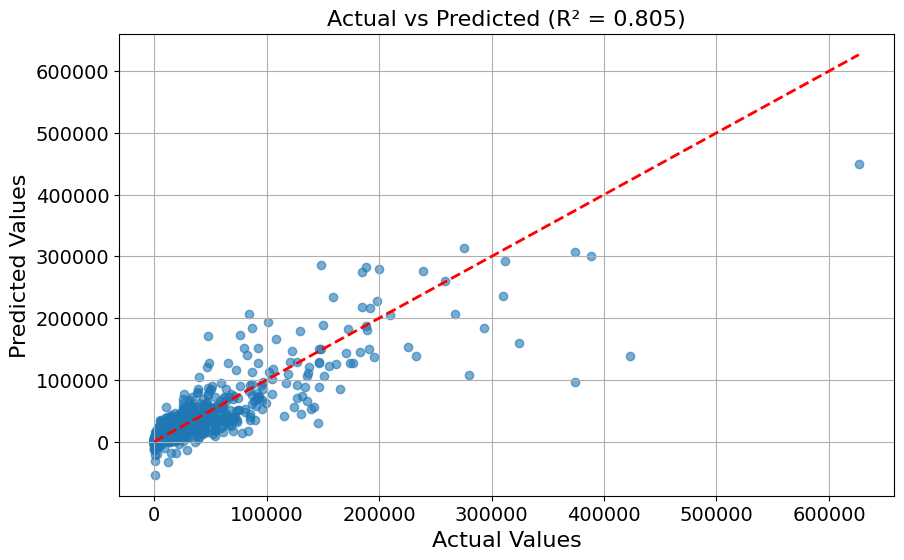

In [311]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score

# Get predictions


# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, predict, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(f'Actual vs Predicted (R² = {r2_score(y_test, predict):.3f})')
plt.grid(True)
plt.show()

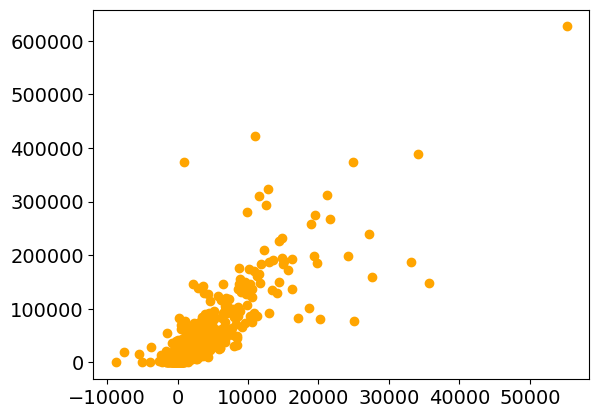

In [312]:
import matplotlib.pyplot as plt

plt.scatter(x_test['EBIT'],y_test,color='orange')

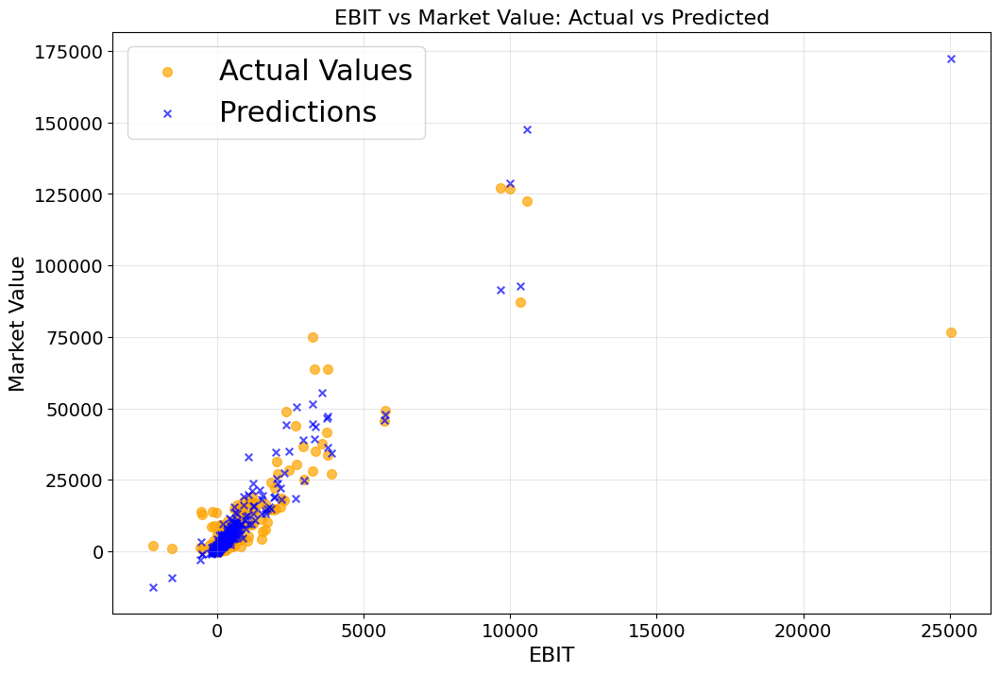

In [313]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=1000
plt.scatter(x_test['EBIT'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBIT'][:amount], predict[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBIT')
plt.ylabel('Market Value')
plt.title('EBIT vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

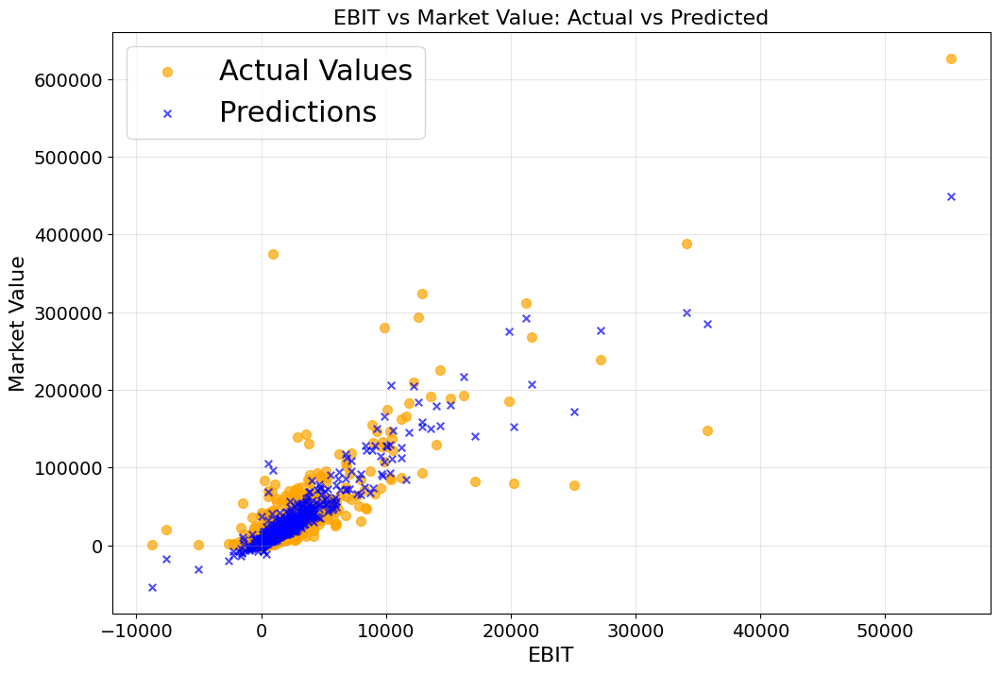

In [314]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=10000
plt.scatter(x_test['EBIT'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBIT'][:amount], predict[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBIT')
plt.ylabel('Market Value')
plt.title('EBIT vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [315]:
SSR=((y_test-predict)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.8053469172240294)

In [316]:

print(f'mse: {mse(y_test,predict)} || mae: {mae(y_test,predict)}')

mse: 48699638.73865173 || mae: 1495.4988788606197


In [317]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Example: assume you already have your dataset loaded
# X = features, y = target (net income)
# X = df.drop("NetIncome", axis=1)
# y = df["NetIncome"]

# Split data

# X=use_df[features]
X=use_df[features]
y=use_df[target]


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# ------------------------------
# 1. Plain Multiple Linear Regression
# ------------------------------
lr = make_pipeline(StandardScaler(), LinearRegression())
lr.fit(x_train, y_train)
print("Linear Regression R^2:", lr.score(x_test, y_test))

# ------------------------------
# 2. Ridge Regression
# ------------------------------
ridge = make_pipeline(StandardScaler(), Ridge(alpha=1.0))  # alpha = regularization strength
ridge.fit(x_train, y_train)
print("Ridge R^2:", ridge.score(x_test, y_test))

# ------------------------------
# 3. Lasso Regression
# ------------------------------
lasso = make_pipeline(StandardScaler(), Lasso(alpha=0.1))  # smaller alpha = less shrinkage
lasso.fit(x_train, y_train)
print("Lasso R^2:", lasso.score(x_test, y_test))

# ------------------------------

# 4. Elastic Net (optional)
# ------------------------------
elastic = make_pipeline(StandardScaler(), ElasticNet(alpha=0.1, l1_ratio=0.5))
elastic.fit(x_train, y_train)
print("ElasticNet R^2:", elastic.score(x_test, y_test))


Linear Regression R^2: 0.8053469172240293
Ridge R^2: 0.8053481600314769
Lasso R^2: 0.8053447148817093
ElasticNet R^2: 0.8046203757170544


In [318]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# X = features, y = target
X = use_df[features]
y = use_df[target]

# ------------------------------
# Ridge Regression
# ------------------------------
ridge = make_pipeline(StandardScaler(), Ridge(alpha=1.0))
ridge.fit(X, y)

ridge_coefs = ridge.named_steps['ridge'].coef_

# ------------------------------
# Lasso Regression
# ------------------------------
lasso = make_pipeline(StandardScaler(), Lasso(alpha=0.1))
lasso.fit(X, y)

lasso_coefs = lasso.named_steps['lasso'].coef_

# ------------------------------
# Compare coefficients
# ------------------------------
coef_df = pd.DataFrame({
    "Feature": features,
    "Ridge": ridge_coefs,
    "Lasso": lasso_coefs
})

print(coef_df.sort_values("Lasso", key=abs, ascending=False).head(10))


                     Feature        Ridge        Lasso
2              current_asset  8224.891252  8224.802996
0                       EBIT  6221.978207  6222.309258
1               gross_profit  5599.576695  5599.451382
4  total_current_liabilities -5501.955773 -5501.391536
3               total_assets  1692.714727  1692.182071
5                 net_income  1299.428945  1299.211468


In [319]:
use_df=bankrupt_df.copy()
X=use_df[more_5_features]
y=use_df['market_value']


x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

pipeline=Pipeline([
    ('scaler',StandardScaler()),
    ('classifier',LinearRegression())
                  
])

pipeline.fit(x_train,y_train)
y_pred=pipeline.predict(x_test)

SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.8525236927120168)

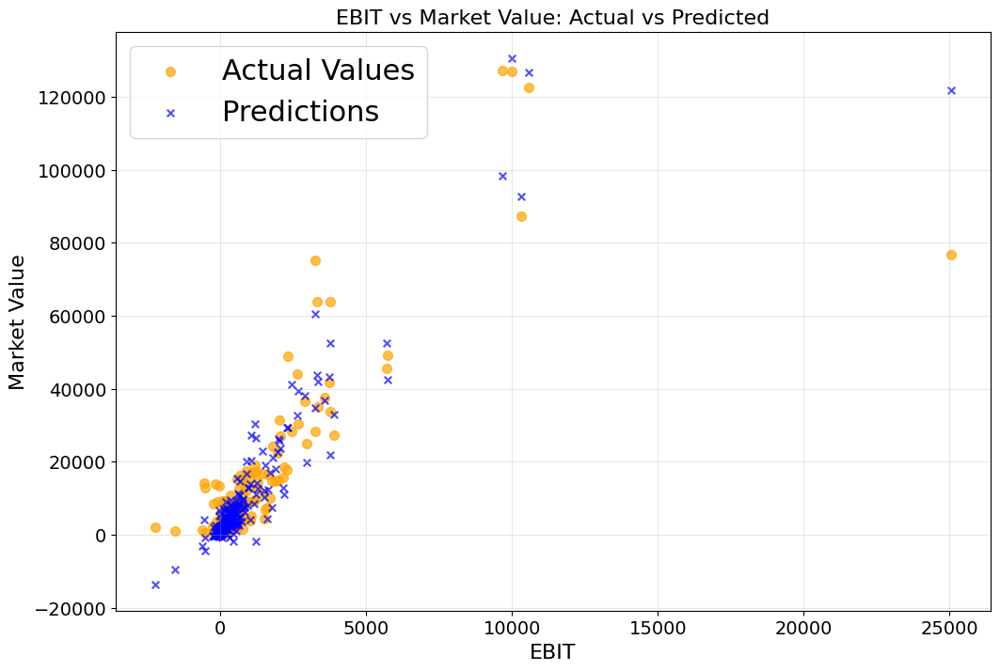

In [320]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=1000
plt.scatter(x_test['EBIT'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBIT'][:amount], y_pred[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBIT')
plt.ylabel('Market Value')
plt.title('EBIT vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [321]:
##########this part is polynomial regression of net_income ##############

In [322]:
############### single polynomial regression

In [323]:

############### multiple polynomial regression
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, SplineTransformer
# X=use_df[features]
y=use_df[target]

X=use_df[['EBIT']]
# X=use_df[features]
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)


degree=2
model = make_pipeline(StandardScaler(),PolynomialFeatures(degree),LinearRegression())
model.fit(x_train,y_train)
y_pred=model.predict(x_test)

print(y_pred[:10])





[-1774.25971788   955.33526683  -301.55459091   491.41003447
   696.11628627   494.39961741   589.81652201  2783.34620944
 23883.19968847  1140.89213151]


In [324]:
y_test[:10]

58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64

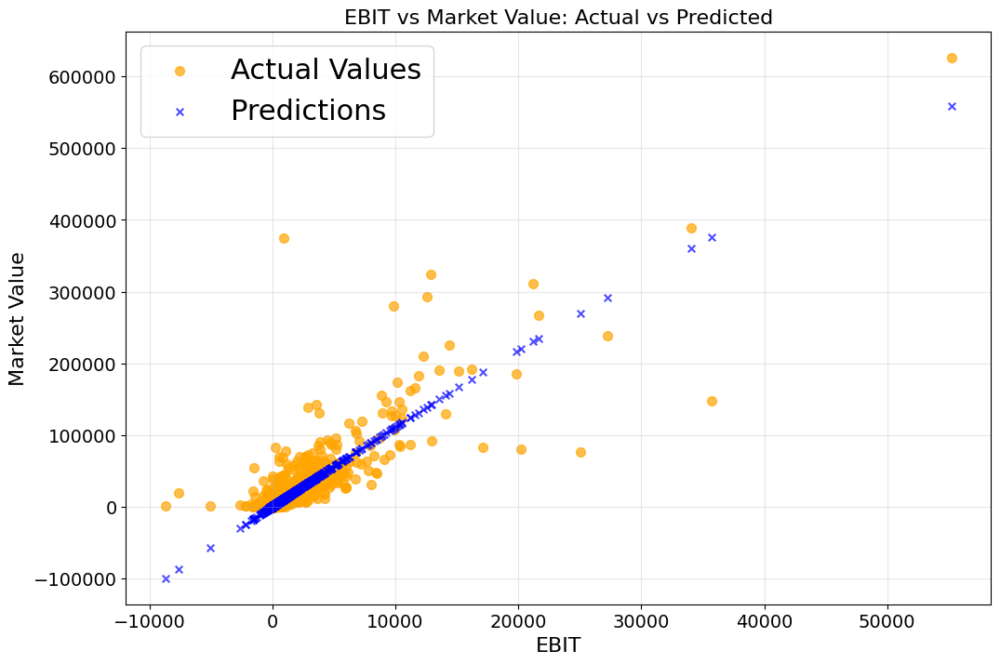

In [325]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=10000

plt.scatter(x_test['EBIT'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBIT'][:amount], y_pred[:amount], color='blue', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBIT')
plt.ylabel('Market Value')
plt.title('EBIT vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [326]:
SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.752336853292547)

In [327]:

print(f'mse: {mse(y_test,y_pred)} || mae: {mae(y_test,y_pred)}')

mse: 61962058.86660418 || mae: 1773.5514580756796


In [328]:
print(y_pred[:10])
################ from scratch for single linearregression #################
print(y_test[:10])

[-1774.25971788   955.33526683  -301.55459091   491.41003447
   696.11628627   494.39961741   589.81652201  2783.34620944
 23883.19968847  1140.89213151]
58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64


In [329]:

############### multiple polynomial regression
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, SplineTransformer
X=use_df[features]
y=use_df[target]

# X=use_df[['EBIT']]
X=use_df[features]
# X=use_df[more_5_features]
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)


degree=2
model = make_pipeline(StandardScaler(),PolynomialFeatures(degree),LinearRegression())
model.fit(x_train,y_train)
y_pred=model.predict(x_test)

print(y_pred)





[-8.64210576e+02  6.74209817e+02 -5.30953456e+02 ...  3.12638661e+00
  6.35010750e+03  9.16197836e+04]


In [330]:
y_test

58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
            ...    
6939       207.8204
11833       47.5898
54981        1.1780
48107    29751.5011
14018    75991.5433
Name: market_value, Length: 15737, dtype: float64

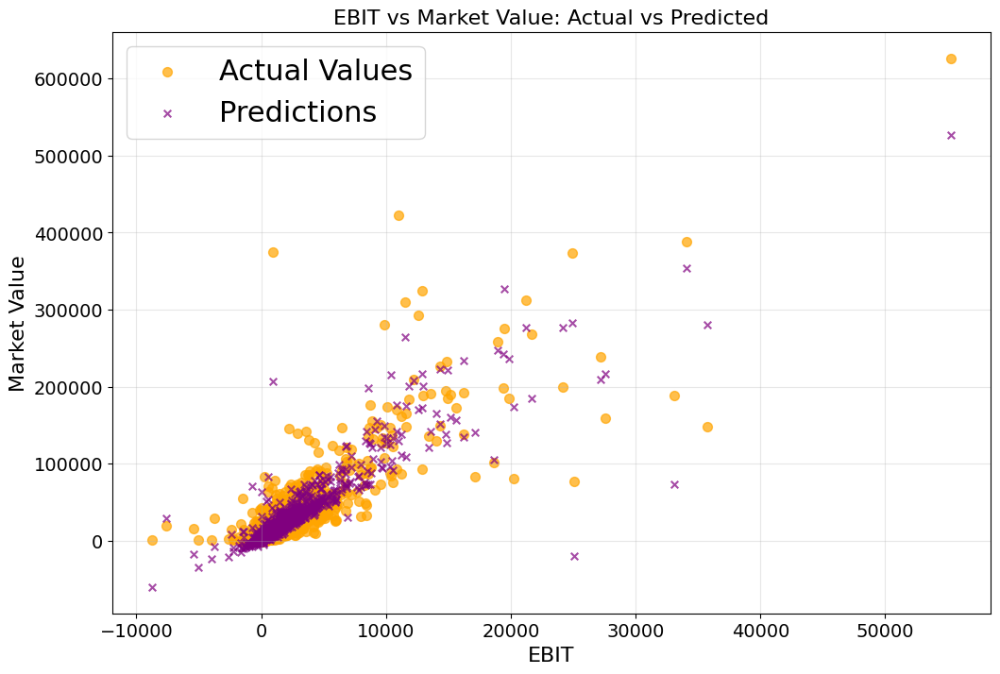

In [331]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(12, 8))
amount=50000

plt.scatter(x_test['EBIT'][:amount], y_test[:amount], color='orange', alpha=0.7, label='Actual Values', s=50)

# Add predictions to the same plot
plt.scatter(x_test['EBIT'][:amount], y_pred[:amount], color='purple', alpha=0.7, label='Predictions', s=30, marker='x')

plt.xlabel('EBIT')
plt.ylabel('Market Value')
plt.title('EBIT vs Market Value: Actual vs Predicted')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [332]:
SSR=((y_test-y_pred)**2).sum()
SST=((y_test-y_test.mean())**2).sum()

R2=1-(SSR/SST)
R2

np.float64(0.8312723919759442)

In [333]:

print(f'mse: {mse(y_test,y_pred)} || mae: {mae(y_test,y_pred)}')

mse: 42213426.259811155 || mae: 1463.0070238083908


In [334]:
print(y_pred[:8])
################ from scratch for single linearregression #################
print(y_test[:10])

[-864.21057584  674.20981667 -530.95345577  217.95832636  232.13457847
   27.55104409   14.38285987 2433.26663292]
58332      745.4671
66075     1268.3580
77412      299.8059
57137      623.6866
9134        56.7578
62130      118.4971
68031        1.4994
59864     9009.7043
9276     27083.6910
27085      743.9679
Name: market_value, dtype: float64
